In [1]:
# required imports 
from engens.core.EnGens import EnGen
import engens.core.FeatureSelector as fs
import pickle
import mdshare
import mdtraj
import numpy as np

In [2]:
# Load EnGen

top_loc = "./ExampleProt.pdb"
traj_loc = "./ExampleTraj.xtc"

binding_side_res = [6, 56, 60, 63, 64, 78, 81, 82, 85, 86, 89, 94, 150, 164, 165, 166, 171, 174, 178, 179, 182, 183, 243, 246, 247, 249, 250, 253, 261, 262, 263, 264, 267, 268, 271, 274, 275]
selstr = ""
for res in binding_side_res:
    selstr += "resid "+str(res)+ " or "
    
selstr = selstr[:-len(" or ")]

engen = EnGen(traj_loc, top_loc, selstr, align=True)
#engen = EnGen(traj_loc, top_loc, selstr)
nglwidget = engen.show_animated_traj()
nglwidget

Cleaning files...: 100%|██████████| 3/3 [00:00<00:00, 175.39it/s]
Making the selection... : 30it [00:03,  7.64it/s]
Cleaning files...: 100%|██████████| 30/30 [00:00<00:00, 586.96it/s]


NGLWidget(max_frame=2999)

In [4]:
# Show full protein and binding site
import nglview as nv

nw = nv.NGLWidget()
nw.add_trajectory(mdtraj.load("./ExampleTraj-aligned.xtc",  
                              top="./ExampleProt.pdb"), 
                  name="full_traj",
                 default_representation=False)
nw[0].add_cartoon(color="blue")
nw.add_trajectory(mdtraj.load("./ExampleTraj-aligned-engen-selected.xtc",
                            top = "./ExampleTraj-aligned-engen-selected.pdb"), 
                 name="binding_site",
                 default_representation=False)
nw[1].add_ball_and_stick(color="red")

In [5]:
nw.background = "black"
nw.center(1)

In [6]:
nw

NGLWidget(background='black', max_frame=2999)

In [6]:
# Featurize

# remove any existing featurizers
engen.reset_featurizers()

# initialize default features 
engen.init_featurizers_default()

21-02-22 00:14:07 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[0] WARNING  Using all residue pairs with schemes like closest or closest-heavy is very time consuming. Consider reducing the residue pairs
21-02-22 00:14:07 pyemma.coordinates.data.featurization.featurizer.MDFeaturizer[1] WARNING  Using all residue pairs with schemes like closest or closest-heavy is very time consuming. Consider reducing the residue pairs


In [7]:
# print the desctiption of the default features
description = engen.describe_featurizers()
print(description)

Featurizer no. 0:
 residue_mindist
['RES_DIST (closest-heavy) TYR7 - ILE64', 'RES_DIST (closest-heavy) TYR7 - SER65', 'RES_DIST (closest-heavy) TYR7 - ALA79', 'RES_DIST (closest-heavy) TYR7 - VAL82', 'RES_DIST (closest-heavy) TYR7 - LEU83', 'RES_DIST (closest-heavy) TYR7 - THR86', 'RES_DIST (closest-heavy) TYR7 - GLN87', 'RES_DIST (closest-heavy) TYR7 - ILE90', 'RES_DIST (closest-heavy) TYR7 - ALA95', 'RES_DIST (closest-heavy) TYR7 - LYS151']...['RES_DIST (closest-heavy) PRO264 - TYR269', 'RES_DIST (closest-heavy) PRO264 - ILE272', 'RES_DIST (closest-heavy) PRO264 - SER275', 'RES_DIST (closest-heavy) PRO264 - HIS276', 'RES_DIST (closest-heavy) LEU265 - ILE272', 'RES_DIST (closest-heavy) LEU265 - SER275', 'RES_DIST (closest-heavy) LEU265 - HIS276', 'RES_DIST (closest-heavy) MET268 - SER275', 'RES_DIST (closest-heavy) MET268 - HIS276', 'RES_DIST (closest-heavy) TYR269 - HIS276']
 Featurizer no. 1:
 backbone_torsions
['COS(PHI 0 ALA 57)', 'SIN(PHI 0 ALA 57)', 'COS(PSI 0 TYR 7)', 'SIN(PSI 

In [8]:
#provide a range of lags and dimensions to train on

#to make an informed decision on lag times see the timescale of your simulation
traj_times = mdtraj.load(engen.traj, top=engen.ref).time
#number of frames
traj_nframes = len(traj_times)
lags = [int(np.log(i)) for i in np.logspace(1, int(traj_nframes/100), num=5, base=np.e)]
dims = [i + 1 for i in range(1,5)]

print(lags)
print(dims)

[1, 8, 15, 22, 30]
[2, 3, 4, 5]


In [20]:
engen.data[0][1]

array([[0.65016276, 0.4207349 , 1.0605104 , ..., 0.8719007 , 0.89615995,
        0.7511356 ],
       [0.63438636, 0.37028608, 1.0416652 , ..., 0.8310724 , 0.9325229 ,
        0.7590576 ],
       [0.52772146, 0.3520884 , 1.0924971 , ..., 0.8266915 , 0.8644963 ,
        0.75177675],
       ...,
       [0.732472  , 0.4468882 , 1.0174643 , ..., 0.8578494 , 0.79198855,
        0.6781525 ],
       [0.72739345, 0.45266894, 1.0869943 , ..., 0.82478464, 0.84129804,
        0.7266148 ],
       [0.6957621 , 0.49170932, 1.0390323 , ..., 0.80346775, 0.794592  ,
        0.70274466]], dtype=float32)

Choosing features with VAMP might take some time...
Running VAMP with different parameters. Might take some time.
dimension =2, lag=1
dimension =2, lag=8
dimension =2, lag=15
dimension =2, lag=22
dimension =2, lag=30
dimension =3, lag=1
dimension =3, lag=8
dimension =3, lag=15
dimension =3, lag=22
dimension =3, lag=30
dimension =4, lag=1
dimension =4, lag=8
dimension =4, lag=15
dimension =4, lag=22
dimension =4, lag=30
dimension =5, lag=1
dimension =5, lag=8
dimension =5, lag=15
dimension =5, lag=22
dimension =5, lag=30


/usr/local/lib/python3.6/site-packages/engens/core/FeatureSelector.py:123: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i][j].set_xticklabels(names, rotation=30)


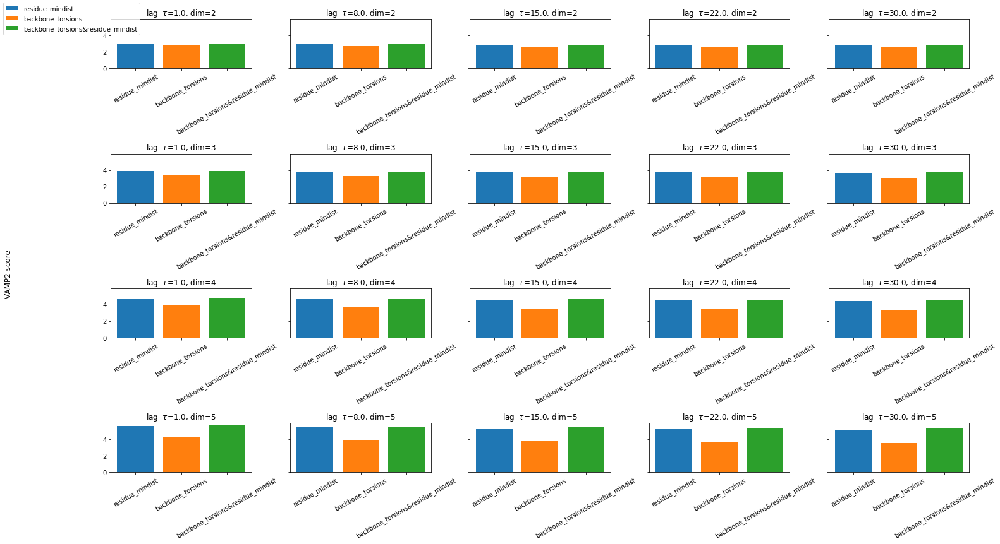

In [21]:
#initialize VAMP2 featurizer and run it
featsel = fs.VAMP2FeatureSelection(lags, dims, engen)
featsel.run_vamp()

#plot VAMP2 results
featsel.plot_results()

In [9]:
featsel = fs.UserFeatureSelection(2, engen)
featsel.select_feature()

Picked featurized no. 2: backbone_torsions&residue_mindist
['COS(PHI 0 ALA 57)', 'SIN(PHI 0 ALA 57)', 'COS(PSI 0 TYR 7)', 'SIN(PSI 0 TYR 7)', 'COS(PHI 0 ALA 61)', 'SIN(PHI 0 ALA 61)', 'COS(PSI 0 ALA 57)', 'SIN(PSI 0 ALA 57)', 'COS(PHI 0 ILE 64)', 'SIN(PHI 0 ILE 64)', 'COS(PSI 0 ALA 61)', 'SIN(PSI 0 ALA 61)', 'COS(PHI 0 SER 65)', 'SIN(PHI 0 SER 65)', 'COS(PSI 0 ILE 64)', 'SIN(PSI 0 ILE 64)', 'COS(PHI 0 ALA 79)', 'SIN(PHI 0 ALA 79)', 'COS(PSI 0 SER 65)', 'SIN(PSI 0 SER 65)', 'COS(PHI 0 VAL 82)', 'SIN(PHI 0 VAL 82)', 'COS(PSI 0 ALA 79)', 'SIN(PSI 0 ALA 79)', 'COS(PHI 0 LEU 83)', 'SIN(PHI 0 LEU 83)', 'COS(PSI 0 VAL 82)', 'SIN(PSI 0 VAL 82)', 'COS(PHI 0 THR 86)', 'SIN(PHI 0 THR 86)', 'COS(PSI 0 LEU 83)', 'SIN(PSI 0 LEU 83)', 'COS(PHI 0 GLN 87)', 'SIN(PHI 0 GLN 87)', 'COS(PSI 0 THR 86)', 'SIN(PSI 0 THR 86)', 'COS(PHI 0 ILE 90)', 'SIN(PHI 0 ILE 90)', 'COS(PSI 0 GLN 87)', 'SIN(PSI 0 GLN 87)', 'COS(PHI 0 ALA 95)', 'SIN(PHI 0 ALA 95)', 'COS(PSI 0 ILE 90)', 'SIN(PSI 0 ILE 90)', 'COS(PHI 0 LYS 151

In [10]:
engen.apply_featurizations()

In [11]:
from engens.core.DimReduction import *

In [12]:
# Perform TICA

#chose TICA 
reduction_type = "TICA" 
#to make an informed decision on lag time range see the timescale of your simulation
traj_times = mdtraj.load(engen.traj, top=engen.ref).time
traj_nframes = len(traj_times)
lags = [int(np.log(i)) for i in np.logspace(2, int(traj_nframes/60), num=15, base=np.e)]

In [13]:
lags

[2, 5, 8, 12, 15, 19, 22, 26, 29, 32, 36, 39, 43, 46, 50]

Transforming with TICA - might take some time!
lag: 2
lag: 5
lag: 8
lag: 12
lag: 15
lag: 19
lag: 22
lag: 26
lag: 29
lag: 32
lag: 36
lag: 39
lag: 43
lag: 46
lag: 50
Chosen lag time: 12
Number of processes above lag time: 14
Number of clearly resolved processes with TICA: 1
Processes (index, timescale): 
[(0, 1447.6077358911523)]


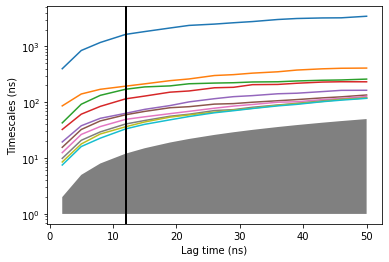

TICA explained variance (with thr = 70) by first 230 components
Total of 70.08066219131607% of variance explaned by first 230 ICs.


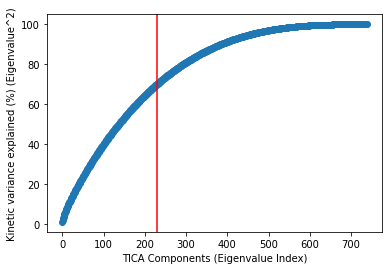

In [14]:

#initialize TICA reducer
reducer = dimreds[reduction_type](engen, lags)
#estimate number of resolved processes and choose the lag time automatically
lag = reducer.choose_lag_auto()
#visualize TICA resolved process scales with different lags
reducer.plot_lag_analysis(chosen_lag=lag)
plt.show()
#choose variance threshold and number of components
var_thr = 70
n_components = reducer.get_variance(var_thr=var_thr)
reducer.plot_variance(var_thr=var_thr)
plt.show()

In [15]:
reducer.TICA_lagtimes

[2, 5, 8, 12, 15, 19, 22, 26, 29, 32, 36, 39, 43, 46, 50]

In [33]:
reducer.choose_lag(7)

In [34]:
n_components

230

In [16]:
#select the corresponding number of components
reducer.choose_n(10)

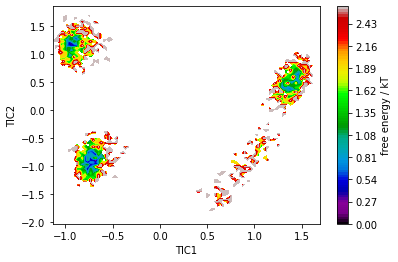

In [17]:
#plot 2d

reducer.plot_2d()
plt.show()

In [18]:
reducer.plot_3d()

In [19]:
reduction_type = "HDE" 
#find best lag range for your data
traj_times = mdtraj.load(engen.traj, top=engen.ref).time
traj_nframes = len(traj_times)
lags = [int(np.log(i)) for i in np.logspace(1, int(traj_nframes/50), num=15, base=np.e)]


In [20]:
lags

[1, 5, 9, 13, 17, 22, 26, 30, 34, 38, 43, 47, 51, 55, 60]

In [21]:
#find best output dimensionality for your data
feat_dims = engen.data[engen.chosen_feat_index][1].shape[1]
# min(50, 10% of the feature dimensions)
output_dims = min(50, int(feat_dims*0.1))

In [22]:
output_dims

50

Transforming with HDE - might take some time!
lag: 1
number of components: 50
feat shape: 739
data shape: 3000


/usr/local/lib/python3.6/site-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.

/usr/local/lib/python3.6/site-packages/hde/hde.py:265: RuntimeWarning:

invalid value encountered in log



lag: 5
number of components: 50
feat shape: 739
data shape: 3000
lag: 9
number of components: 50
feat shape: 739
data shape: 3000
lag: 13
number of components: 50
feat shape: 739
data shape: 3000
lag: 17
number of components: 50
feat shape: 739
data shape: 3000
lag: 22
number of components: 50
feat shape: 739
data shape: 3000
lag: 26
number of components: 50
feat shape: 739
data shape: 3000
lag: 30
number of components: 50
feat shape: 739
data shape: 3000
lag: 34
number of components: 50
feat shape: 739
data shape: 3000
lag: 38
number of components: 50
feat shape: 739
data shape: 3000
lag: 43
number of components: 50
feat shape: 739
data shape: 3000
lag: 47
number of components: 50
feat shape: 739
data shape: 3000
lag: 51
number of components: 50
feat shape: 739
data shape: 3000
lag: 55
number of components: 50
feat shape: 739
data shape: 3000
lag: 60
number of components: 50
feat shape: 739
data shape: 3000
Chosen lag time: 13
Number of clearly resolved processes with HDE: 5
Processes

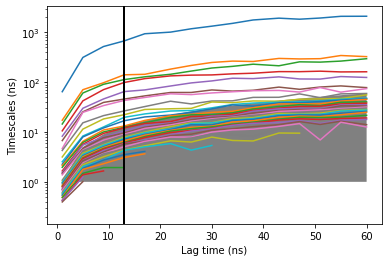

In [23]:

#initialize HDE reducer
reducer = dimreds[reduction_type](engen, lags, output_dims)
#estimate number of resolved processes and choose the lag time automatically
lag = reducer.choose_lag_auto()
#visualize HDE resolved process scales with different lags
reducer.plot_lag_analysis(chosen_lag=lag)
plt.show()

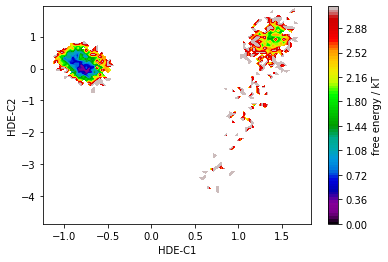

In [141]:
reducer.plot_2d()

In [142]:
reducer.plot_3d()

In [44]:
reducer.apply()

In [ ]:
#---------------------#
# possibly we should discard first half of the trajectory???

In [42]:
#required imports

from engens.core.EnGens import EnGen
from engens.core.ClustEn import *
import pickle as pk

In [45]:
engen.dimred_data

array([[-1.3868495 , -0.51152956,  0.9732674 , ...,  0.549284  ,
         0.3346215 , -0.42289916],
       [-1.3184723 , -0.4492454 ,  0.8421337 , ...,  0.45845938,
         0.7019287 , -0.07308556],
       [-1.263424  , -0.17124534,  0.89089024, ..., -0.43758544,
        -0.03790858, -0.3981264 ],
       ...,
       [ 0.8963653 , -1.8421025 , -0.53394735, ...,  0.8377074 ,
        -1.0768738 , -0.6695799 ],
       [ 0.7123252 , -1.56698   , -0.3886847 , ...,  2.223676  ,
         0.01744054, -0.4393564 ],
       [ 0.78683966, -1.3260357 , -0.8925578 , ...,  1.6109071 ,
        -1.222103  ,  0.05789003]], dtype=float32)

In [46]:
clustering = "KM"
cluster_method = clusterings[clustering](engen)

Clustering with params={'n_clusters': 2}
Clustering with params={'n_clusters': 3}
Clustering with params={'n_clusters': 4}
Clustering with params={'n_clusters': 5}
Clustering with params={'n_clusters': 6}
Clustering with params={'n_clusters': 7}
Clustering with params={'n_clusters': 8}
Clustering with params={'n_clusters': 9}


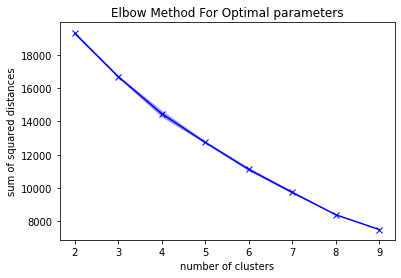

Optimal index=3
Optimal params={'n_clusters': 5}


3

In [47]:
# Create K clusters

if clustering =="KM":
    params = [{"n_clusters":i} for i in range(2, 10)]
else:
    params = [{"n_components":i} for i in range(2, 10)]
cluster_method.cluster_multiple_params(params)

# analyze these parameters with the elbow method
cluster_method.analyze_elbow_method()

Best parameter index from silhouette analysis are 7
Best parameters from silhouette analysis are {'n_clusters': 9}


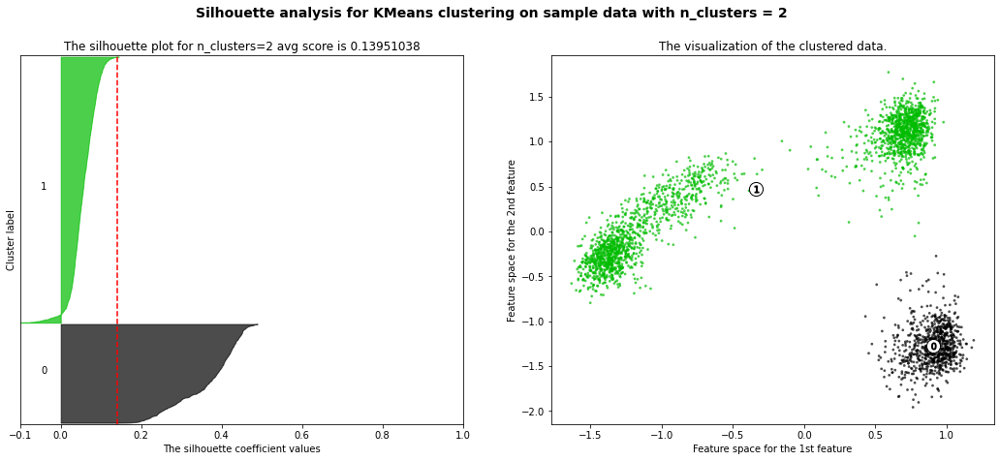

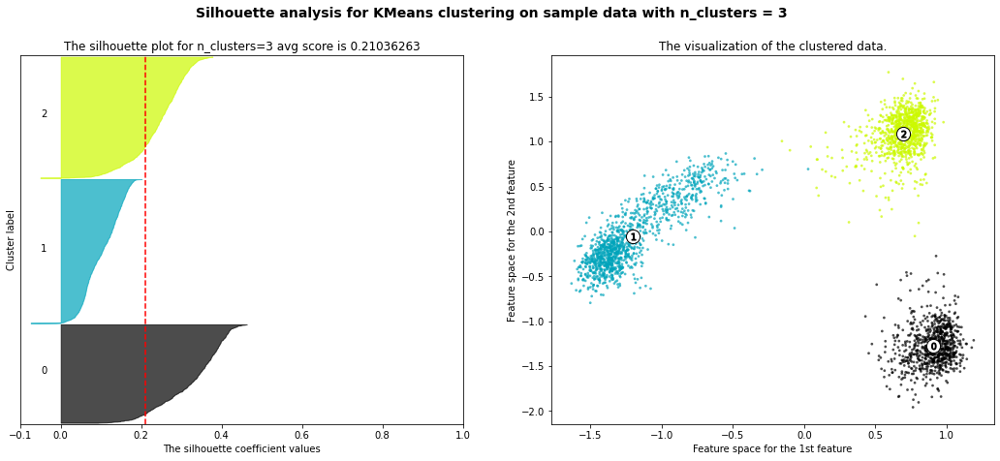

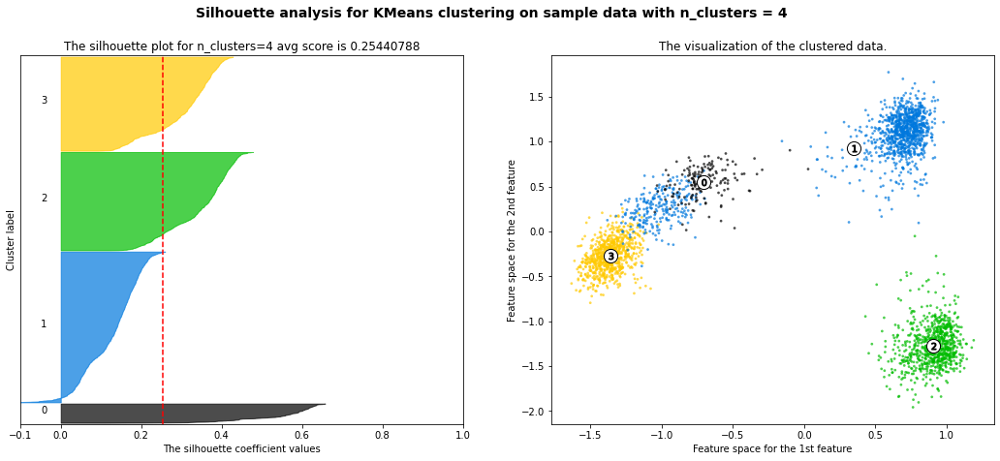

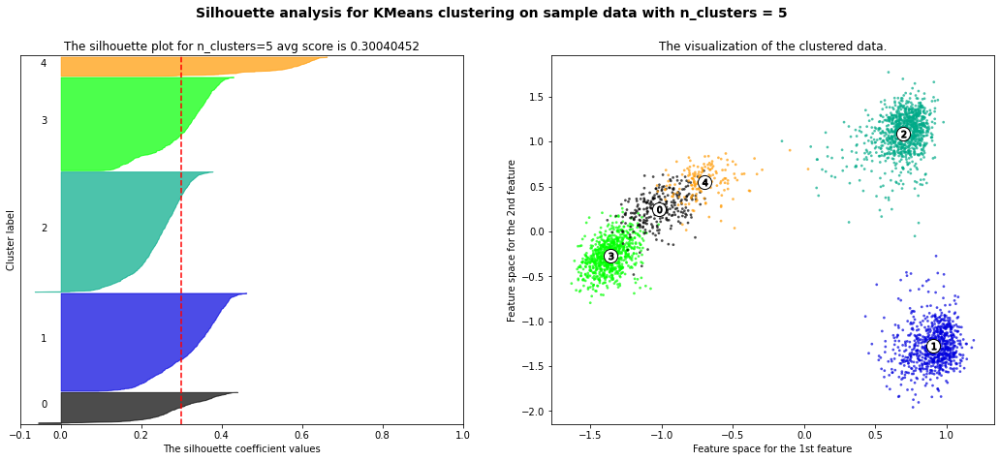

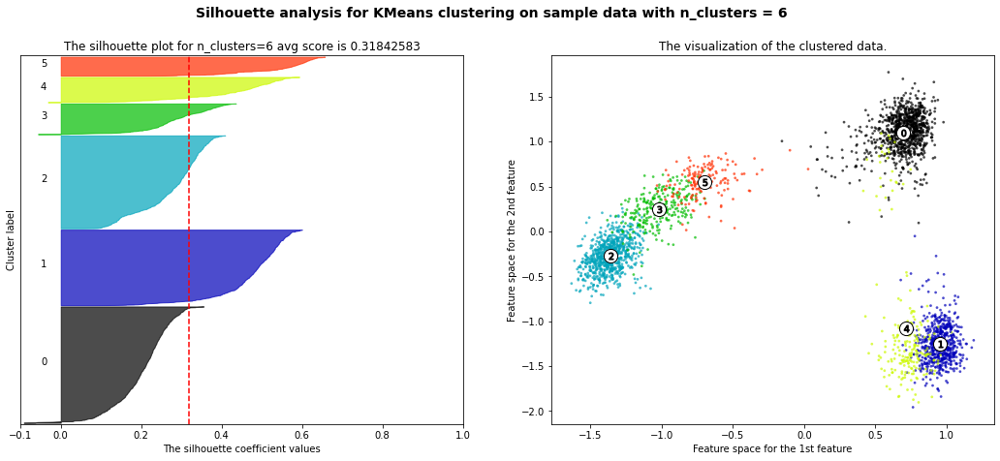

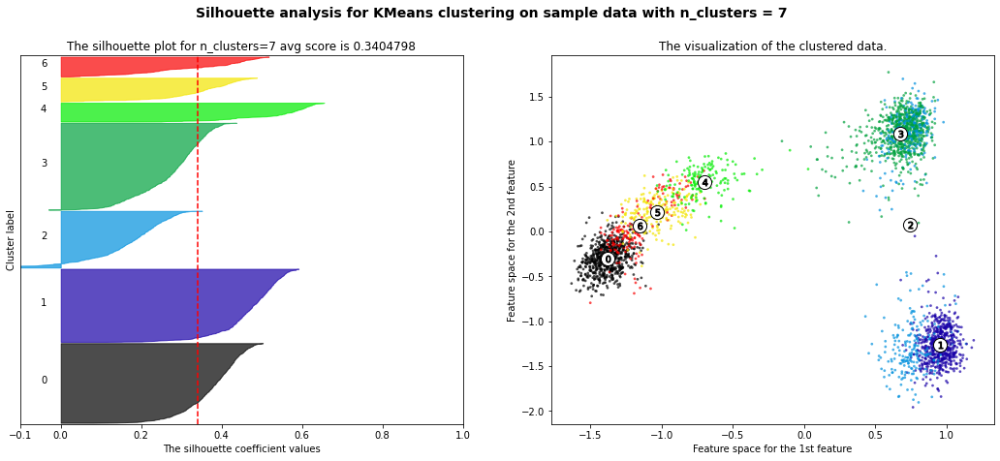

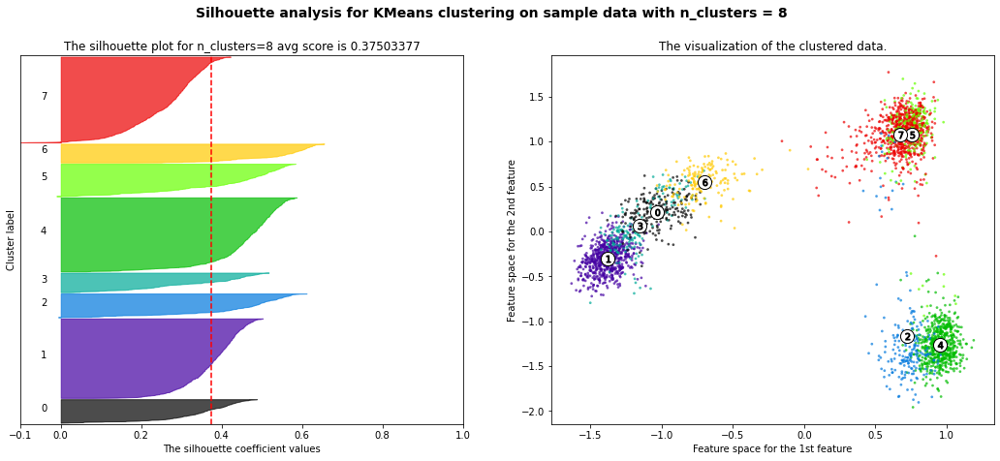

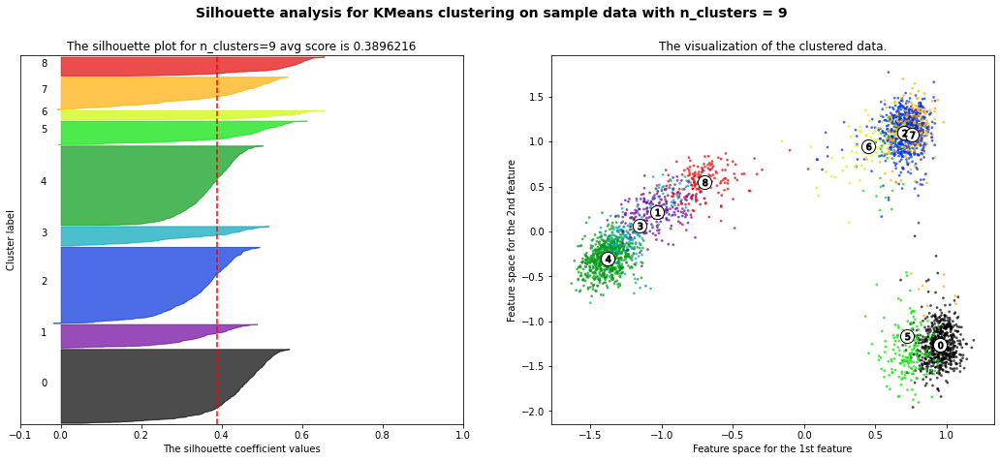

In [48]:
# analyze these parameters with the silhouette method
cluster_method.analyze_silhouette()

In [49]:
# pick the parameter index
param_index = 3

cluster_method.choose_param(param_index)

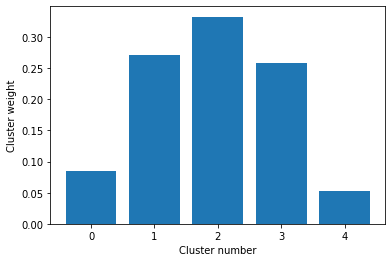

In [50]:
cluster_method.plot_cluster_weight()

In [51]:
clustering = "GMM" 
cluster_method = clusterings[clustering](engen, n_rep=3)

In [52]:
params = [{"n_components":i} for i in range(2, 10)]
cluster_method.cluster_multiple_params(params)

Clustering with params={'n_components': 2}
Clustering with params={'n_components': 3}
Clustering with params={'n_components': 4}
Clustering with params={'n_components': 5}
Clustering with params={'n_components': 6}
Clustering with params={'n_components': 7}
Clustering with params={'n_components': 8}
Clustering with params={'n_components': 9}


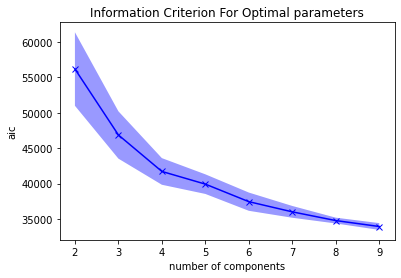

Optimal index=2
Optimal params={'n_components': 4}


2

In [54]:
cluster_method.analyze_ic()

Best parameter index from silhouette analysis are 7
Best parameters from silhouette analysis are {'n_components': 9}


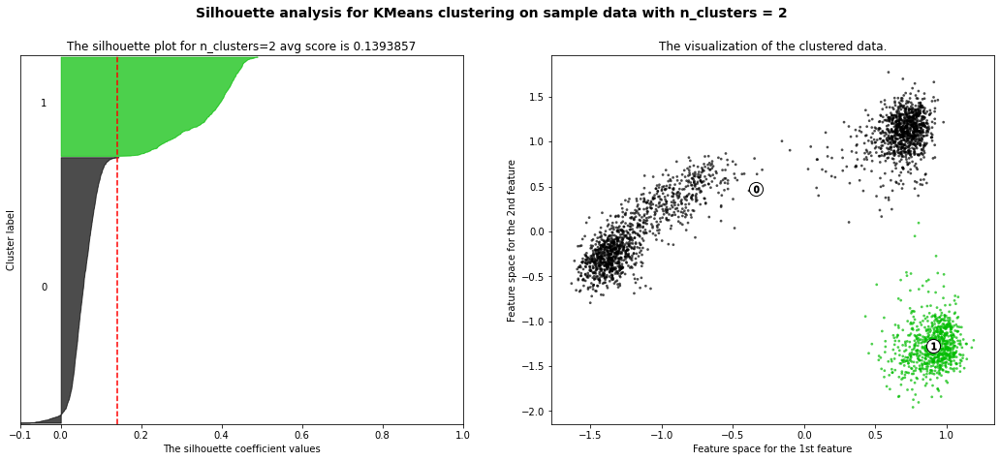

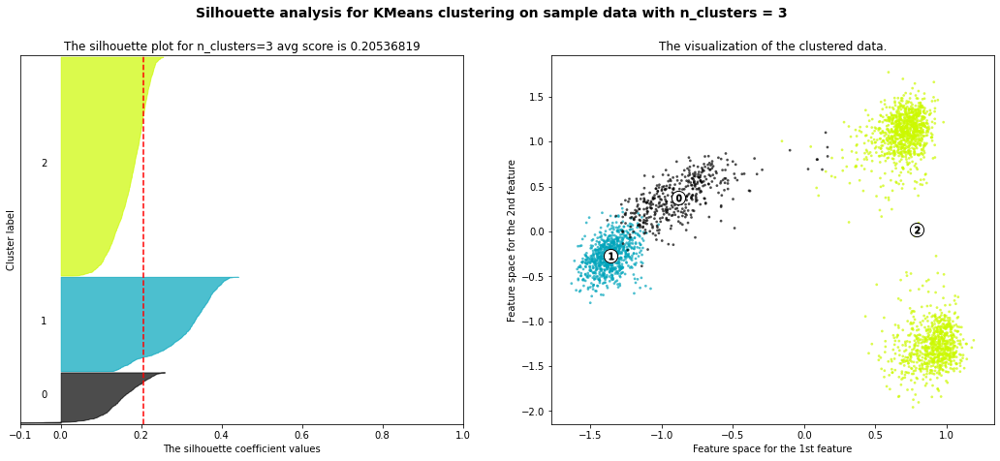

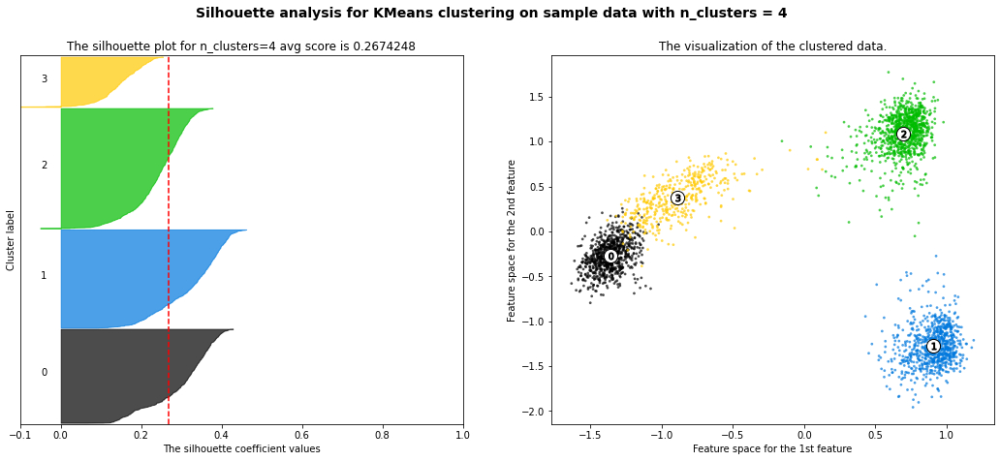

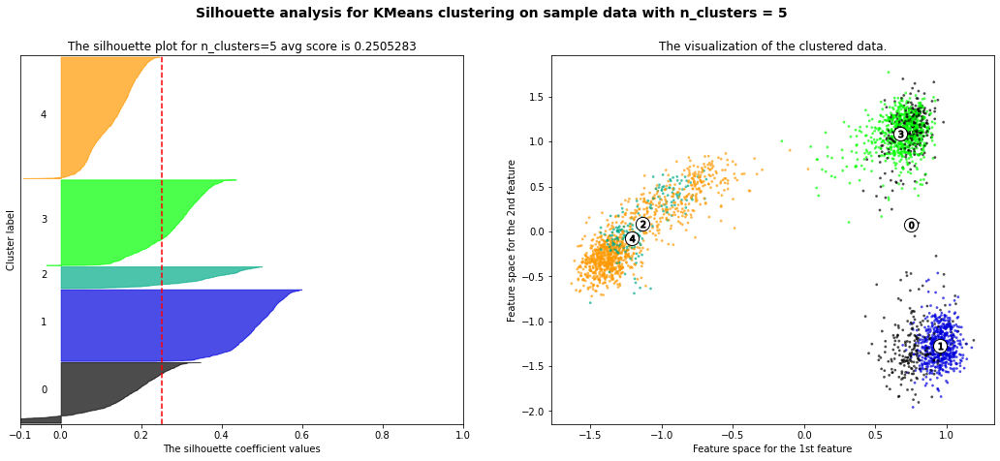

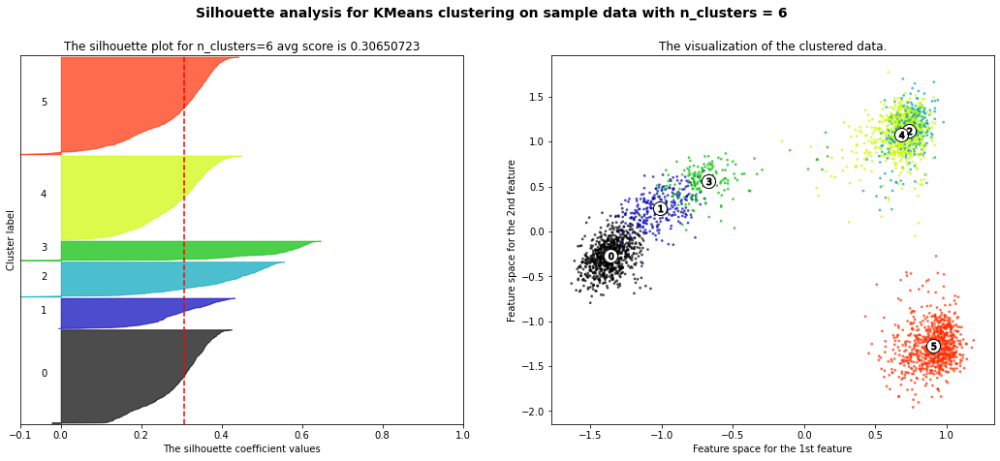

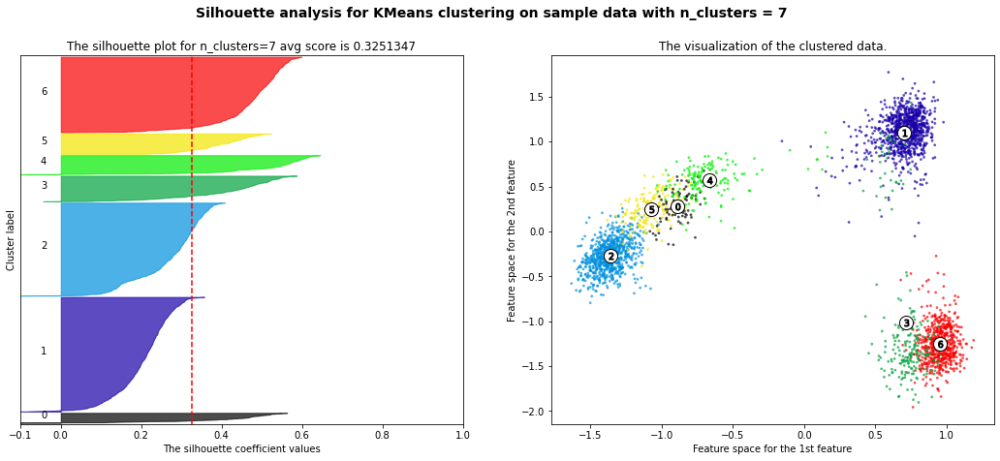

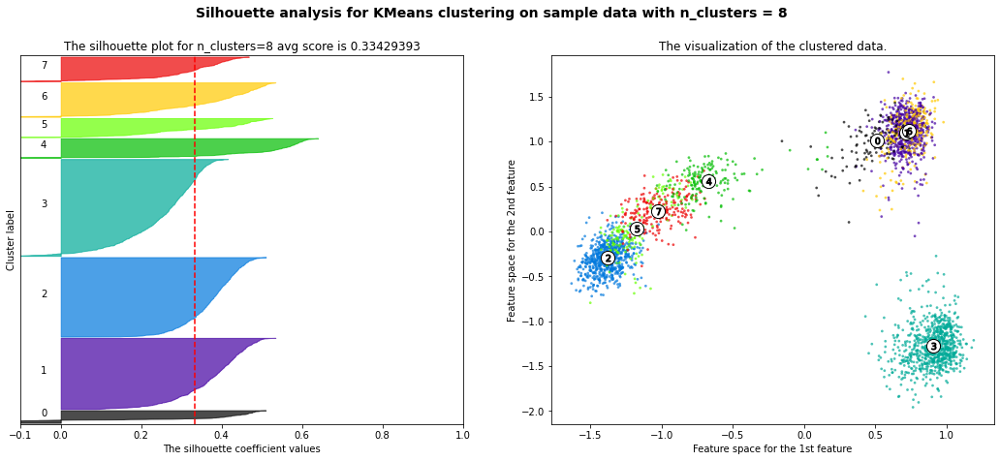

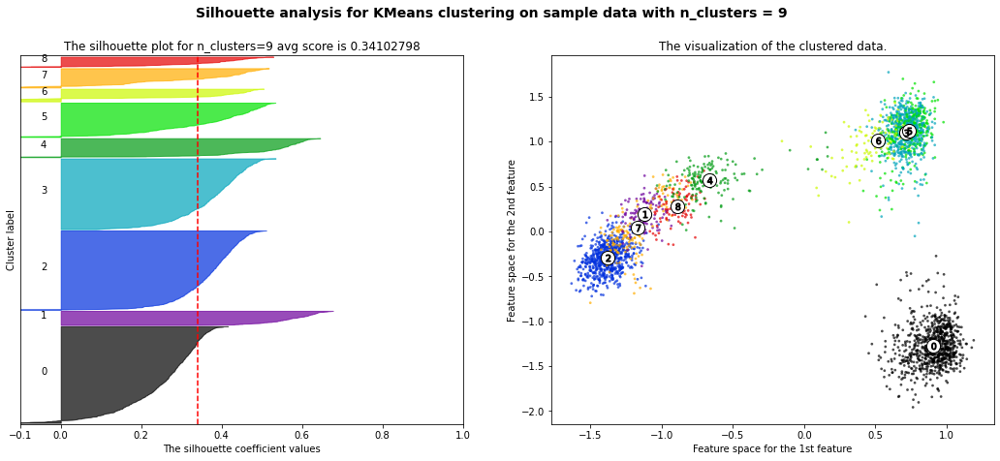

In [55]:

cluster_method.analyze_silhouette()

In [56]:
# pick the parameter index
param_index = 2

cluster_method.choose_param(param_index)

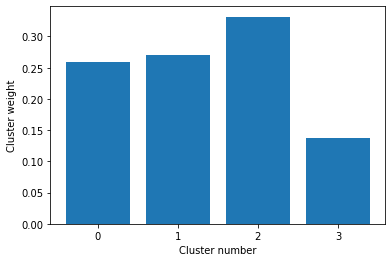

In [57]:
cluster_method.plot_cluster_weight()

0
1
2
3
Closest conformation inside cluster 0 frame [[438]] of the striped trajectory
Extracting and saving
Closest conformation inside cluster 1 frame [[1574]] of the striped trajectory
Extracting and saving
Closest conformation inside cluster 2 frame [[1439]] of the striped trajectory
Extracting and saving
Closest conformation inside cluster 3 frame [[1032]] of the striped trajectory
Extracting and saving


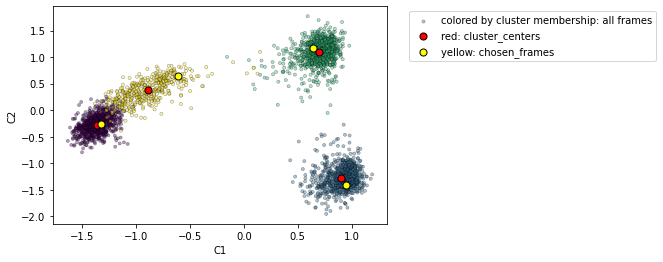

In [68]:
ensemble_location = "./res_ensemble_jerome"
cluster_method.choose_conformations()
cluster_method.extract_conformations(ensemble_location)

In [69]:
dimred = reducer
clust = cluster_method

In [70]:
#required imports
from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import interactive, fixed, IntSlider, VBox, HBox, Layout
import ipywidgets as widgets
import matplotlib.patheffects as PathEffects
from IPython.display import display,clear_output
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from engens.core.EnGens import EnGen
from engens.core.ClustEn import *
from engens.core.FeatureSelector import *
from engens.core.DimReduction import *
import pickle as pk
import os

In [74]:

from engens.core.EnGens import EnGen
from engens.core.ClustEn import *
from engens.core.FeatureSelector import *
from engens.core.DimReduction import *

traj_len = dimred.transformed_data.shape[0]

x = dimred.transformed_data[:,0]
y =  dimred.transformed_data[:,1]
x_max, y_max, x_min, y_min = (max(x), max(y), min(x), min(y))
frame_c = cm.plasma(np.linspace(0, traj_len, traj_len)/traj_len)
color_opt = "frame"
cluster_c = clust.labels[clust.chosen_param_index]
c=frame_c
scat_size=10

rep_fnum = closest_conf
rep_len = len(rep_fnum)
rep_x = x[rep_fnum]
rep_y = y[rep_fnum]
rep_c = cm.Set1(np.linspace(0, rep_len, rep_len)/rep_len)
rep_size = 400
reps_text = []

In [79]:

from plotly.offline import iplot
from plotly.graph_objs import graph_objs as go

def view_timeline():
    pfig = go.Figure()
    scatter = go.Scatter(x=list(range(5001)), y=clust.labels[clust.chosen_param_index],              
            marker=dict(
                size=3,
                color=clust.labels[clust.chosen_param_index],
                colorscale="Viridis"
            ),
        mode="markers"
        )
    pfig.add_trace(scatter)
    for i, rf in enumerate(rep_fnum): 
        atxt = "Cluster "+str(clust.labels[clust.chosen_param_index][rf])+"; Frame "+str(rf)
        pfig.add_vline(x=rf, line_width=1, line_dash="dash", line_color="red", 
              annotation_text=atxt)
    pfig.update_layout(go.Layout(width=800, height=400),
    xaxis_title="trajectory frames",
    yaxis_title="cluster",
    hovermode="x"
                )
    pfig.update_yaxes(dtick="d")
    iplot(pfig)

In [80]:
def view_PCs():
    marker_labels = []
    lablist = list(clust.labels[clust.chosen_param_index])
    for i, elem in enumerate(lablist):
        marker_labels.append("cluster="+str(elem)+" \n frame="+str(i))
    
    pfig = go.Figure()
    scatter = go.Scatter(x=x, y=y,              
            marker=dict(
                size=3,
                color=clust.labels[clust.chosen_param_index],
                colorscale="Viridis"
            ),
        mode="markers",
        text = marker_labels,
        hovertemplate = "<b>%{text}</b>"
        )
    pfig.add_trace(scatter)
    scatter = go.Scatter(x=rep_x, y=rep_y,              
            marker=dict(
                size=6,
                color='red',
                line=dict(width=2,color='DarkSlateGrey')
            ),
        mode="markers",
        text = rep_fnum,
        hovertemplate = "<b>Representative (frame - %{text})</b>"
        )
    pfig.add_trace(scatter)
    pfig.update_layout(go.Layout(width=450, height=450,showlegend=False),
    xaxis_title="C1",
    yaxis_title="C2")
    iplot(pfig)

In [81]:

def view_bar():
    bar = go.Bar(x=list(range(clust.chosen_param_index+2)) ,
                 y=clust.cluster_weights(clust.chosen_param_index),
                 marker={'color': list(range(clust.chosen_param_index+2)), 'colorscale': "Viridis"})
    pfig = go.Figure()
    pfig.add_trace(bar)
    pfig.update_layout(go.Layout(width=450, height=450),
        xaxis_title="cluster",
        yaxis_title="cluster weight")
    pfig.update_xaxes(dtick="d")
    if not clust.thr == None:
        pfig.add_hline(y=clust.thr, line_width=2, line_dash="dash", line_color="black", 
                  annotation_text="cluster cutoff")
    iplot(pfig)

In [82]:
widg1 = interactive(view_timeline)
widg2 = interactive(view_PCs)
widg3 = interactive(view_bar)
display(VBox([HBox([widg2, widg3]), widg1]))

In [83]:
import nglview as nv
import pytraj as pt
import matplotlib.colors as mc

In [94]:
plt.ioff() 

In [100]:
colors = cm.viridis(np.linspace(0, clust.chosen_param_index+2, clust.chosen_param_index+2)/(clust.chosen_param_index+2))

In [101]:
res_pdbs = []
for file in os.listdir("./res_ensemble"):
    if file[-4:] == ".pdb":
        res_pdbs.append(file)

nw = nv.NGLWidget()
for i, pdb_file in enumerate(res_pdbs):
    clust_n = clust.labels[clust.chosen_param_index][clust.chosen_frames[i]] 
    name = "Cluster - "+str(clust_n)
    nw.add_component("./res_ensemble/"+pdb_file, name=name,default_representation=False)
    nw[i].add_ball_and_stick(color = mc.rgb2hex(colors[clust_n].flatten()))

ValueError: RGBA sequence should have length 3 or 4

In [105]:
colors[clust_n].flatten()

array([0.267004, 0.004874, 0.329415, 1.      ])

In [97]:
nw.center()
nw

NGLWidget()

In [283]:
traj_len = dimred.transformed_data.shape[0]

x = dimred.transformed_data[:,0]
y =  dimred.transformed_data[:,1]
x_max, y_max, x_min, y_min = (max(x), max(y), min(x), min(y))
frame_c = cm.plasma(np.linspace(0, traj_len, traj_len)/traj_len)
color_opt = "frame"
cluster_c = clust.labels[clust.chosen_index]
c=frame_c
scat_size=10

rep_fnum = closest_conf
rep_len = rep_fnum.shape[0]
rep_x = x[rep_fnum]
rep_y = y[rep_fnum]
rep_c = cm.Set1(np.linspace(0, rep_len, rep_len)/rep_len)
rep_size = 400
reps_text = []
for i, elem in enumerate(rep_fnum):
    reps_text.append("C"+str(i)+"-F"+str(elem))
    

out_frame_cmap = widgets.Output()
gradient = np.linspace(0, traj_len, traj_len)/traj_len
gradient = np.vstack((gradient, gradient))
with out_frame_cmap:
    plt.figure(figsize=(7, 0.2))
    plt.imshow(gradient, aspect='auto', cmap="plasma")
    plt.gca().set_axis_off()
    plt.show()

out_plot = widgets.Output(layout=widgets.Layout(height='400px', width = '500px', justify_content='center'))


global ax
ax=None
global reps
reps = None
global reps_vis
reps_vis = False
reps2 = None


with out_plot:
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(1, 1, 1)
    scatter = ax.scatter(x[1], y[1],
            color = c[1, :], cmap="plasma",
            s=scat_size, alpha =0.5, )
    
    reps=ax.scatter(rep_x, rep_y, s=rep_size, color=rep_c, marker="*",
        edgecolors="black")
    reps.set_visible(reps_vis)
    ax.set_xlim([x_min, x_max])
    ax.set_ylim([y_min, y_max])
    ax.set_xlabel('C1')
    ax.set_ylabel('C2')
    plt.show()
    


def update(slider, x, y, c):
    frames = slider
    new_y = y[:frames]
    new_x = x[:frames]
    reps_vis = reps.get_visible()
    ax.clear()
    scatter = ax.scatter(new_x, new_y,
        c = c[:frames, :], cmap="plasma",
        s=10, alpha =0.5, )
        
    ax.scatter(x[frames], y[frames],
        color="red",
        s=100, alpha =1, marker="D",
        edgecolors="black")
    
    reps2 = ax.scatter(rep_x, rep_y, s=rep_size, color=rep_c, marker="*", edgecolors="black", visible=reps_vis)
    for i, txt in enumerate(reps_text):
        txt_tmp = ax.annotate(txt, (rep_x[i], rep_y[i]), visible=reps_vis, fontsize=20, color=rep_c[i], weight="bold")
        txt_tmp.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='black')])
        
    #reps = tmp
    ax.set_xlim([x_min, x_max])
    ax.set_ylim([y_min, y_max])
    with out_plot:
        clear_output(wait=True)
        display(ax.figure)
    return slider

play = widgets.Play(
    value=1,
    min=0,
    max=traj_len,
    step=1,
    disabled=False
)


frame_slider = widgets.IntSlider(value=1,min=0,max=traj_len,step=10,description='show frames:\n',)

widgets.jslink((play, 'value'), (frame_slider, 'value'))
box_fslider = HBox([play, frame_slider])

slider = interactive(update, slider=frame_slider, x = fixed(x), y = fixed(y), c = fixed(c))


box = widgets.Checkbox(False, description='show cluster representatives')
def changed(b):
    value = b["owner"].value
    if value:
        reps_vis = True
    else:
        reps_vis = False
    reps.set_visible(reps_vis)
    update(frame_slider.value, x, y, c)    
box.observe(changed)


command_pallete = HBox([box_fslider, out_frame_cmap, box], layout=Layout(display='flex', flex_flow='column'))
nglwidget = engen.show_animated_traj()
nglwidget.clear_representations()
nglwidget.add_ball_and_stick()

interactive1 = VBox([command_pallete, out_plot])

#box_layout = Layout(display='flex', flex_flow='row', justify_content='center', align_items='center')

display(HBox([ VBox([]), VBox([interactive1, nglwidget]), VBox([])]))

In [139]:
# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()